In [3]:
import pandas as pd                  # Импорт библиотеки pandas для работы с табличными данными (DataFrame)
import numpy as np                   # Импорт библиотеки numpy для работы с массивами и числовыми операциями
import seaborn as sns                # Импорт библиотеки seaborn для создания красивых и информативных визуализаций данных
from matplotlib import pyplot as plt # Импорт функции pyplot из библиотеки matplotlib для создания графиков и визуализаций
from tabulate import tabulate
from statsmodels.stats.outliers_influence import variance_inflation_factor
import plotly.graph_objects as go
import os
import statsmodels.api as sm      # предоставляет инструменты для статистического моделирования
import scipy.stats as stats
import networkx as nx                                      # для создания и  изучения структуры сложных сетей
import random

import warnings
warnings.filterwarnings('ignore')

**Additional Variable Information**



1.   ID number
2.   Diagnosis (M = malignant, B = benign)
3. 3-32
Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter)

b) texture (standard deviation of gray-scale values)

c) perimeter

d) area

e) smoothness (local variation in radius lengths)

f) compactness (perimeter^2 / area - 1.0)

g) concavity (severity of concave portions of the contour)

h) concave points (number of concave portions of the contour)

i) symmetry

j) fractal dimension ("coastline approximation" - 1)

# Преобразования для работы с данными

In [5]:
breast_df = pd.read_csv('https://raw.githubusercontent.com/VinogradovAI/breast_cancer_prediction/refs/heads/master/data/raw/data.csv')
breast_df.head() # выведем первые 5 строк таблицы по прямой ссылке из статьи

,ID,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,M
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


In [7]:
breast_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  569 non-null    int64  
 1   radius1             569 non-null    float64
 2   texture1            569 non-null    float64
 3   perimeter1          569 non-null    float64
 4   area1               569 non-null    float64
 5   smoothness1         569 non-null    float64
 6   compactness1        569 non-null    float64
 7   concavity1          569 non-null    float64
 8   concave_points1     569 non-null    float64
 9   symmetry1           569 non-null    float64
 10  fractal_dimension1  569 non-null    float64
 11  radius2             569 non-null    float64
 12  texture2            569 non-null    float64
 13  perimeter2          569 non-null    float64
 14  area2               569 non-null    float64
 15  smoothness2         569 non-null    float64
 16  compactn

In [8]:
breast_df.shape #Узнаем количество строк и столбцов в датафрейме

(569, 32)

In [9]:
# Вывод уникальных значений столбца 'diagnosis'
unique_diagnosis = breast_df['Diagnosis'].unique()
print(unique_diagnosis)

['M' 'B']


In [10]:
# Заменяем значения в столбце 'Diagnosis'
breast_df['Diagnosis'] = breast_df['Diagnosis'].replace({'M': 1, 'B': 0})

# Преобразуем название столбца 'Diagnosis' в нижний регистр
breast_df.rename(columns={'Diagnosis': 'diagnosis'}, inplace=True)

# Преобразуем столбец 'diagnosis' в float
breast_df['diagnosis'] = breast_df['diagnosis'].astype(float)
breast_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  569 non-null    int64  
 1   radius1             569 non-null    float64
 2   texture1            569 non-null    float64
 3   perimeter1          569 non-null    float64
 4   area1               569 non-null    float64
 5   smoothness1         569 non-null    float64
 6   compactness1        569 non-null    float64
 7   concavity1          569 non-null    float64
 8   concave_points1     569 non-null    float64
 9   symmetry1           569 non-null    float64
 10  fractal_dimension1  569 non-null    float64
 11  radius2             569 non-null    float64
 12  texture2            569 non-null    float64
 13  perimeter2          569 non-null    float64
 14  area2               569 non-null    float64
 15  smoothness2         569 non-null    float64
 16  compactn

In [12]:
# Удаляем столбец ID из оригинального DataFrame
df_cytology = breast_df.drop(columns=['ID'])
df_cytology.head()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,1.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,1.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,1.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,1.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,1.0


In [13]:
# смотрим уникальные значения, отсутвующие значения и их процент, столбцы с 0 значением и тип данных с столбцах
def highlight_missing(value):
    if value == "nan" or value == 0:
        return f"\033[91m{value}\033[0m"
    else:
        return str(value)

def get_feature_type(col):
    if df_cytology[col].dtype == 'object':
        return "Categorical"
    else:
        return "Numerical"

print(tabulate([
    [col, highlight_missing(df_cytology[col].nunique()), highlight_missing((df_cytology[col] == 0).sum()), highlight_missing(df_cytology[col].isnull().sum()), f"{(df_cytology[col].isnull().sum() / len(df_cytology)) * 100:.1f}%", get_feature_type(col)]
    for col in df_cytology.columns
], headers=["features", "unique value", "Values zero", "Missing_Number", "Missing_Percent", "features type"], tablefmt="fancy_grid"))


╒════════════════════╤════════════════╤═══════════════╤══════════════════╤═══════════════════╤═════════════════╕
│ features           │   unique value │   Values zero │   Missing_Number │ Missing_Percent   │ features type   │
╞════════════════════╪════════════════╪═══════════════╪══════════════════╪═══════════════════╪═════════════════╡
│ radius1            │            456 │             0 │                0 │ 0.0%              │ Numerical       │
├────────────────────┼────────────────┼───────────────┼──────────────────┼───────────────────┼─────────────────┤
│ texture1           │            479 │             0 │                0 │ 0.0%              │ Numerical       │
├────────────────────┼────────────────┼───────────────┼──────────────────┼───────────────────┼─────────────────┤
│ perimeter1         │            522 │             0 │                0 │ 0.0%              │ Numerical       │
├────────────────────┼────────────────┼───────────────┼──────────────────┼───────────────────┼──

In [14]:
df_cytology.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu') # выводим  статистику

,count,mean,std,min,25%,50%,75%,max
radius1,569.000000,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.110000
texture1,569.000000,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.280000
perimeter1,569.000000,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.500000
area1,569.000000,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.000000
smoothness1,569.000000,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.163400
compactness1,569.000000,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.345400
concavity1,569.000000,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.426800
concave_points1,569.000000,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.201200
symmetry1,569.000000,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.304000
fractal_dimension1,569.000000,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.097440


# анализ кореляций

In [15]:
# Рассчитаем матрицу корреляций
corr_matrix = df_cytology.corr()

# вычислим ранг матрицы корреляций
rank = np.linalg.matrix_rank(corr_matrix)

# определим матрицу корреляций
det = np.linalg.det(corr_matrix)

print(f"Ранг матрицы корреляций: {rank}")
print(f"Определитель матрицы корреляций: {det:.3f}")
# ранг матрицы равен 31, а определитель равен 0, это может указывать на то, что в данных есть линейные зависимости между переменными,
# это означает, что одна из переменных может быть линейно зависима от других, что и приводит к нулевому определителю.

Ранг матрицы корреляций: 31
Определитель матрицы корреляций: 0.000


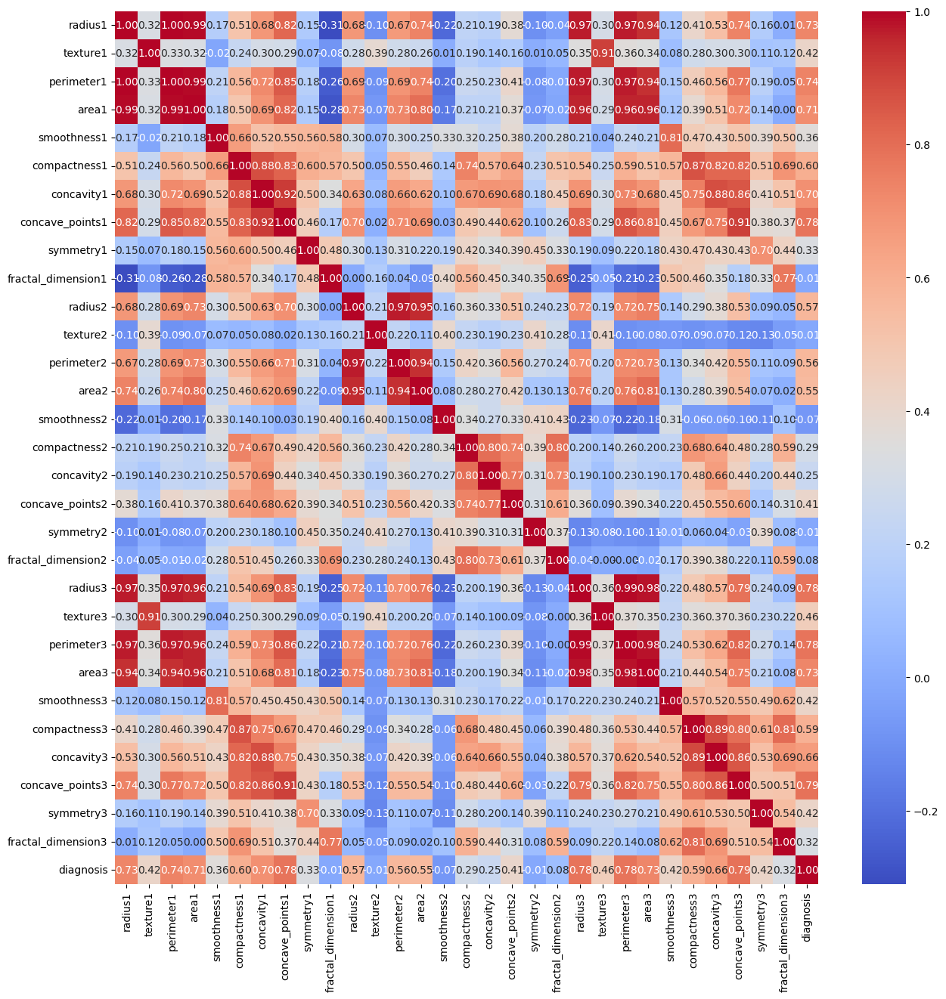

               feature           VIF
0              radius1  63787.228031
1             texture1    251.122570
2           perimeter1  58217.307016
3                area1   1305.508785
4          smoothness1    393.410071
5         compactness1    201.524726
6           concavity1    158.130682
7      concave_points1    154.891431
8            symmetry1    184.542087
9   fractal_dimension1    654.870560
10             radius2    237.352381
11            texture2     24.675389
12          perimeter2    211.429834
13               area2     72.669276
14         smoothness2     26.395387
15        compactness2     44.979263
16          concavity2     33.676991
17     concave_points2     54.072023
18           symmetry2     37.194742
19  fractal_dimension2     27.556836
20             radius3   9960.892269
21            texture3    343.506199
22          perimeter3   4494.531141
23               area3   1164.089106
24         smoothness3    375.598751
25        compactness3    132.894041
2

In [16]:
# # Вычисление корреляционной матрицы
correlation_matrix = df_cytology.corr().round(2)
# Визуализация корреляционной матрицы
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()
# Вычисление VIF
vif_data = pd.DataFrame()
vif_data["feature"] = df_cytology.columns
vif_data["VIF"] = [variance_inflation_factor(df_cytology.values, i) for i in range(df_cytology.shape[1])]
print(vif_data)

In [17]:
# Рассчитываем матрицу корреляций
corr_matrix = df_cytology.corr().round(3)
print(corr_matrix)

                    radius1  texture1  perimeter1  area1  smoothness1  \
radius1               1.000     0.324       0.998  0.987        0.171   
texture1              0.324     1.000       0.330  0.321       -0.023   
perimeter1            0.998     0.330       1.000  0.987        0.207   
area1                 0.987     0.321       0.987  1.000        0.177   
smoothness1           0.171    -0.023       0.207  0.177        1.000   
compactness1          0.506     0.237       0.557  0.499        0.659   
concavity1            0.677     0.302       0.716  0.686        0.522   
concave_points1       0.823     0.293       0.851  0.823        0.554   
symmetry1             0.148     0.071       0.183  0.151        0.558   
fractal_dimension1   -0.312    -0.076      -0.261 -0.283        0.585   
radius2               0.679     0.276       0.692  0.733        0.301   
texture2             -0.097     0.386      -0.087 -0.066        0.068   
perimeter2            0.674     0.282       0.693  

diagnosis
0.0    357
1.0    212
Name: count, dtype: int64


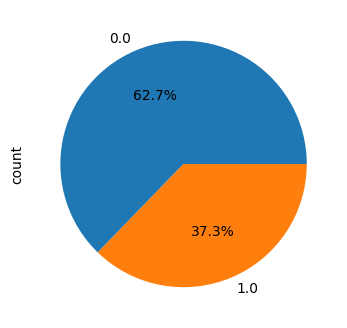

In [18]:
print(df_cytology['diagnosis'].value_counts())
df_cytology['diagnosis'].value_counts().plot(kind="pie", autopct='%1.1f%%', figsize=(4,4));

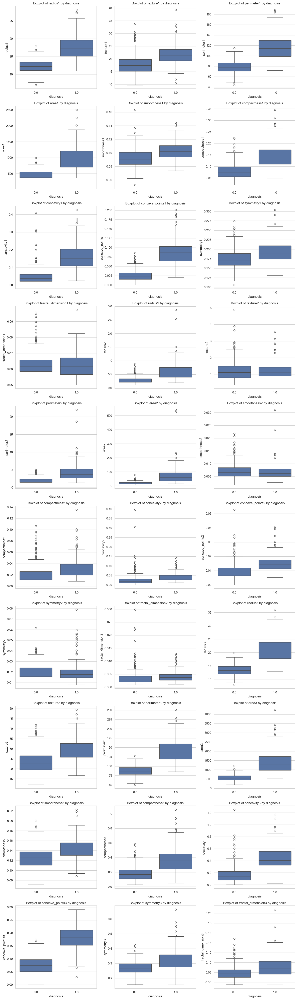

In [19]:
# Определяем таргет
target_column = 'diagnosis'

# Получаем числовые столбцы
numeric_columns = df_cytology.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Проверяем, существует ли таргет в списке числовых колонок
if target_column in numeric_columns:
    numeric_columns.remove(target_column)  # Убираем таргет из списка

# Устанавливаем стиль графиков
sns.set(style="whitegrid")

# Определяем количество подграфиков в строке
num_columns = 3
num_rows = (len(numeric_columns) + num_columns - 1) // num_columns  # Округление вверх

# Создаем фигуру для подграфиков
plt.figure(figsize=(15, 5 * num_rows))

# Создаем боксплоты для каждого числового признака
for i, column in enumerate(numeric_columns):
    plt.subplot(num_rows, num_columns, i + 1)  # Определяем позицию подграфика
    sns.boxplot(x=target_column, y=column, data=df_cytology)
    plt.title(f'Boxplot of {column} by {target_column}')
    plt.xlabel(target_column)
    plt.ylabel(column)

# Подгонка макета
plt.tight_layout()
plt.show()

# немного статистики

In [20]:
Y = df_cytology['diagnosis']
# Задаем независимые переменные (добавляем константу)
X = df_cytology[['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1',
                  'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2',
                  'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2',
                  'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3',
                  'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3']]
# Добавляем константу
X = sm.add_constant(X)
# Создаем модель
model = sm.OLS(Y, X).fit()
# Выводим результаты
print(model.summary())
# Получаем результаты в виде DataFrame
results_df = pd.DataFrame({
    'Coefficients': model.params,
    'Standard Errors': model.bse,
    't-values': model.tvalues,
    'p-values': model.pvalues
})


                            OLS Regression Results                            
Dep. Variable:              diagnosis   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     61.53
Date:                Sun, 17 Nov 2024   Prob (F-statistic):          6.05e-153
Time:                        15:22:21   Log-Likelihood:                 29.650
No. Observations:                 569   AIC:                             2.699
Df Residuals:                     538   BIC:                             137.4
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -2.0218      0

In [21]:
# Список переменных для проверки
variables_to_check = [
    'radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1',
               'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2',
               'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3',
               'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3'
]
# Проверка однородности дисперсий с использованием теста Левена
results = {}

# Получаем данные для групп 0 и 1
group_0 = df_cytology[df_cytology['diagnosis'] == 0]
group_1 = df_cytology[df_cytology['diagnosis'] == 1]

for var in variables_to_check:
    # Проверяем, существует ли переменная в DataFrame
    if var in df_cytology.columns:
        # Извлекаем данные для каждой группы и удаляем возможные пропуски
        data_0 = group_0[var].dropna()
        data_1 = group_1[var].dropna()

        # Выполняем тест Левена, если есть данные в обеих группах
        if len(data_0) > 0 and len(data_1) > 0:
            levene_test = stats.levene(data_0, data_1)
            results[var] = {
                'Statistic': round(levene_test.statistic, 3),
                'p-value': round(levene_test.pvalue, 3)
            }
        else:
            results[var] = {
                'Statistic': None,
                'p-value': None,
                'Message': 'Not enough data in one of the groups'
            }
    else:
        results[var] = {
            'Statistic': None,
            'p-value': None,
            'Message': f'Variable {var} not found in DataFrame'
        }

# Выводим результаты
for var, result in results.items():
    print(f'Variable: {var}')
    if result['Statistic'] is not None:
        print(f'  Statistic: {result["Statistic"]}')
        print(f'  p-value: {result["p-value"]}')

        # Проверка нулевой гипотезы
        alpha = 0.05
        if result['p-value'] < alpha:
            print("  Conclusion: Reject the null hypothesis (variances are not equal).")
        else:
            print("  Conclusion: Fail to reject the null hypothesis (variances are equal).")
    else:
        print(f'  Message: {result["Message"]}')
    print()

 # Создание DataFrame для сохранения результатов
results2_df = pd.DataFrame.from_dict(results, orient='index')

# Добавление колонки с выводом заключений
results2_df['Conclusion'] = results2_df['p-value'].apply(lambda p:
    "Reject the null hypothesis (variances are not equal)." if p < 0.05 else "Fail to reject the null hypothesis (variances are equal)."
)


Variable: radius1
  Statistic: 90.477
  p-value: 0.0
  Conclusion: Reject the null hypothesis (variances are not equal).

Variable: texture1
  Statistic: 0.684
  p-value: 0.409
  Conclusion: Fail to reject the null hypothesis (variances are equal).

Variable: perimeter1
  Statistic: 91.237
  p-value: 0.0
  Conclusion: Reject the null hypothesis (variances are not equal).

Variable: area1
  Statistic: 170.206
  p-value: 0.0
  Conclusion: Reject the null hypothesis (variances are not equal).

Variable: smoothness1
  Statistic: 0.838
  p-value: 0.36
  Conclusion: Fail to reject the null hypothesis (variances are equal).

Variable: compactness1
  Statistic: 39.892
  p-value: 0.0
  Conclusion: Reject the null hypothesis (variances are not equal).

Variable: concavity1
  Statistic: 70.484
  p-value: 0.0
  Conclusion: Reject the null hypothesis (variances are not equal).

Variable: concave_points1
  Statistic: 94.906
  p-value: 0.0
  Conclusion: Reject the null hypothesis (variances are not e

In [22]:
sns.pairplot(df_cytology, hue="diagnosis", palette="inferno", corner=True);

In [23]:

# Определяем целевой столбец
target_column = 'diagnosis'
# Рассчитываем корреляционную матрицу
correlation_matrix = df_cytology.corr()
# Определяем значимые связи (например, корреляция выше 0.5 или ниже -0.5)
threshold = 0.5
significant_edges = []
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        if i != j:
            if abs(correlation_matrix.iloc[i, j]) > threshold:
                significant_edges.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
# Удаляем дубликаты, если они есть
significant_edges = list(set(significant_edges))
# Определяем узлы
nodes = list(set([edge[0] for edge in significant_edges] + [edge[1] for edge in significant_edges]))
# Создаем граф
G = nx.DiGraph()
G.add_nodes_from(nodes)
G.add_edges_from(significant_edges)
# Получаем позиции узлов для визуализации
pos = nx.spring_layout(G, seed=42)
x_nodes = [pos[node][0] for node in G.nodes()]
y_nodes = [pos[node][1] for node in G.nodes()]
# Получаем позиции узлов для 3D визуализации
pos_3d = {node: (pos[node][0], pos[node][1], np.random.uniform(-1, 1)) for node in G.nodes()}
x_nodes = [pos_3d[node][0] for node in G.nodes()]
y_nodes = [pos_3d[node][1] for node in G.nodes()]
z_nodes = [pos_3d[node][2] for node in G.nodes()]

# Создаем график с помощью Plotly для 3D
edge_x = []
edge_y = []
edge_z = []
for edge in G.edges():
    x0, y0, z0 = pos_3d[edge[0]]
    x1, y1, z1 = pos_3d[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)  # Для разрыва линии
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)  # Для разрыва линии
    edge_z.append(z0)
    edge_z.append(z1)
    edge_z.append(None)  # Для разрыва линии

# Создаем узлы
node_trace = go.Scatter3d(
    x=x_nodes, y=y_nodes, z=z_nodes,
    mode='markers+text',
    text=list(G.nodes()),
    textposition="bottom center",
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        color='skyblue',
        line_width=2
    ),
)

# Создаем линии для рёбер
edge_trace = go.Scatter3d(
    x=edge_x, y=edge_y, z=edge_z,
    line=dict(width=0.5, color='gray'),
    hoverinfo='none',
    mode='lines'
)

# Создаем фигуру и добавляем узлы и рёбра
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='3D граф значимых связей между признаками',
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=40),
                    scene=dict(
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        zaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                    )
                )
)

# Отображаем график
fig.show()